In [1]:
from IPython.core.display import HTML
# Most of this lecture is stolen from Cary, a little from Eric and some other scattered pieces

# What is web scraping?

The practice of gathering data through any means other than a program interacting with an API.

# Why do we web scrape?

Browsers are good for many things, but not so much for gathering information

- Sometimes the data we want isn't available packaged all nicely
- Sometimes the company doesn't want to make it easy for us to get all their data
- Sometimes the data source we need isn't big enough to warrant that company creating an API

# How do we do it?

If you can view it in your browser, you can grab it with a python script!

We'll discuss what packages you need when we get there.

# Is there an easier way?

API's are a thing. Sometimes they give us what we need and that's nice.

# What are the keys to a good scraper?

Some things to keep in mind when building your scraper:

- Save all the data you collect
- Don't abuse try:excepts
- Don't get banned from the site you're interested in

## Afternoon Objectives

1. Understand the process of getting data from the web.
2. Know the basics of HTML/CSS:
    * Know how to pull desired data from web pages.
3. Be able to use existing API's to get fetch pre-formatted data.

### Internet vs. World Wide Web

* The internet is commonly refered to as a network of networks. It is the infrastructure that allows networks all around the world to connect with one another. There are many different protocols to transfer information within this larger, meta-network.
* The World Wide Web, or Web, provides one of the ways that data can be transfered over the internet. Uses a **U**niform **R**esource **L**ocator, URL, to specify the location, within the internet, of a document.
* Documents on the web are generally written in **H**yper**T**ext **M**arkup **L**anguage, HTML, which can be natively viewed by browsers, the tool that we use to browse the web.

### Communication on the Web

Information is transmitted around the web through a number of protocols. The main one that you will see is the **H**yper**T**ext **T**ransfer **P**rotocol, HTTP. These transfers, called **requests**, are initiated in a number of ways, but always begin with the client, read: you at your browser.

There are 4 main types of request that can be issued by your browser: get, post, put and delete. For web scraping purposes, you will almost always be using get requests. We will learn some more about the others in a couple of weeks during data products day.

### HTML & CSS
HTML, or *HyperText Markup Language*, is the language that virtually all web pages are written in.  HTML allows us to describe how web pages should render themselves and display content.  They do this by using *HTML Tags*, where each tag is describing different document content.  For example we could specify the title of our page with the following tags: `<title>This is the Title!</title>`.  `<title>` is the opening tag and `</title>` is the corresponding closing tag.  Anything that falls in the middle will be interpreted as the title of the document.  For a more in-depth introduction to HTML, please refer to [this w3schools Tutorial](http://www.w3schools.com/html/html_intro.asp).

We can also apply *attributes* to HTML tags to control how they will be stylized.  Let's say we would like to change the color of our super original title tag to red to make it pop.  We could easily achieve this with the following style attribute: `<title style="color:red;">This is a red Title!</title>`.  But what if we have a very large website and want to change the look and feel of the entire thing?  Certainly there has to be a better way than manually manipulating individual tags?  

This can easily be achieved with the use of *Cascading Style Sheets*, or CSS.  Typically CSS is defined in a separate style sheet file with a `.css` extension which controls how certain tags are stylized.  For example, the following CSS block would make any `<p>` tags have red text and be in the courier font:

```css
p  {
    color: red;
    font-family: courier;
}
```

This is all well and good, but our goal isn't to build websites, it's to systematically extract information from them!  To this end, CSS selectors provide a succinct way of only selecting certain aspects from a potentially giant block of HTML.

#### CSS Selectors
To really see the power of CSS selectors we need to see them in action!  To that end, try getting through the first 10-15 levels of the [Game of Fruit](http://flukeout.github.io/).

You can also refer to this [CSS Selector Cheatsheet](http://www.cheetyr.com/css-selectors)

# Scraping from a Web Page with Python

Scraping a web site basically comes down to making a request from Python and parsing through the HTML that is returned from each page. For each of these tasks we have a Python library, `requests` and `bs4`, respectively.

### Requests Library

The [requests](http://docs.python-requests.org/en/latest/index.html) library is designed to simplify the process of making http requests within Python. The interface is mindbogglingly simple. Instantiate a requests object to the request, this will mostly be a `get`, with the URL and optional parameters you'd like passed through the request. That instance make the results of the request available via attributes/methods.

In [2]:
import requests
fun_cheap = 'http://sf.funcheap.com'
r = requests.get('http://sf.funcheap.com/2016/06/25/')

In [3]:
r.text[:1000] # First 1000 characters of the HTML

'<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Transitional//EN" "http://www.w3.org/TR/xhtml1/DTD/xhtml1-transitional.dtd">\r\n<html xmlns="http://www.w3.org/1999/xhtml" lang="en-US" xmlns:fb="http://www.facebook.com/2008/fbml" xmlns:og="http://opengraphprotocol.org/schema/">\r\n\r\n<head profile="http://gmpg.org/xfn/11">\r\n<script src="//cdn.optimizely.com/js/195632799.js"></script>\r\n\r\n<meta http-equiv="Content-Type" content="text/html; charset=UTF-8" />\r\n\r\n\r\n<title>Events for June 25, 2016 Archives - FunCheapSF.com</title>\r\n\r\n<meta name="generator" content="WordPress" /> <!-- leave this for stats -->\r\n\r\n<link rel="stylesheet" href="http://cdn.funcheap.com/wp-content/themes/arthemia-premium/style.css?v=1.6" type="text/css" media="screen" />\r\n<link rel="stylesheet" href="http://cdn.funcheap.com/wp-content/themes/arthemia-premium/madmenu.css?v=1.1" type="text/css" media="screen" />\r\n<!--[if IE 6]>\r\n    <style type="text/css">\r\n    body {\r\n        behavior:url

### Getting Info from a Web Page with BeautifulSoup

Now that we can gain easy access to the HMTL for a web page, we need some way to pull the desired content from it. Luckily there is already a system in place to do this. With a combination of HMTL and CSS selectors we can identify the information on a HMTL page that we wish to retrieve and grab it with [BeautifulSoup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/#searching-the-tree).

“Beautiful Soup, so rich and green,

Waiting in a hot tureen!

Who for such dainties would not stoop?

Soup of the evening, beautiful Soup!”

--Lewis Carroll

In [4]:
import requests
import re
from bs4 import BeautifulSoup

In [5]:
r = requests.get('http://www.espn.com/college-football/statistics/player/_/stat/passing/sort/passingYards/year/2015/qualified/false/count/1')

In [6]:
bs_obj = BeautifulSoup(r.text, 'html.parser')

In [7]:
bs_obj.findAll('tr',{'class':'evenrow','class':'oddrow'})

[<tr align="right" class="oddrow player-23-504866"><td align="left">1</td><td align="left"><a href="http://www.espn.com/college-football/player/_/id/504866/brandon-doughty">Brandon Doughty</a>, QB</td><td align="left"><span title="Western Kentucky">WKU</span></td><td>388</td><td>540</td><td>71.9</td><td class="sortcell">5055</td><td>9.4</td><td>78</td><td>48</td><td>9</td><td>15</td><td>176.5</td></tr>,
 <tr align="right" class="oddrow player-23-547401"><td align="left">3</td><td align="left"><a href="http://www.espn.com/college-football/player/_/id/547401/jared-goff">Jared Goff</a>, QB</td><td align="left"><span title="California">CAL</span></td><td>341</td><td>529</td><td>64.5</td><td class="sortcell">4719</td><td>8.9</td><td>80</td><td>43</td><td>13</td><td>26</td><td>161.3</td></tr>,
 <tr align="right" class="oddrow player-23-550629"><td align="left">5</td><td align="left"><a href="http://www.espn.com/college-football/player/_/id/550629/luke-falk">Luke Falk</a>, QB</td><td align="l

In [8]:
bs_obj.findAll('tr',{'class':re.compile('^(evenrow|oddrow)')})

[<tr align="right" class="oddrow player-23-504866"><td align="left">1</td><td align="left"><a href="http://www.espn.com/college-football/player/_/id/504866/brandon-doughty">Brandon Doughty</a>, QB</td><td align="left"><span title="Western Kentucky">WKU</span></td><td>388</td><td>540</td><td>71.9</td><td class="sortcell">5055</td><td>9.4</td><td>78</td><td>48</td><td>9</td><td>15</td><td>176.5</td></tr>,
 <tr align="right" class="evenrow player-23-513573"><td align="left">2</td><td align="left"><a href="http://www.espn.com/college-football/player/_/id/513573/matt-johnson">Matt Quinn Johnson</a>, QB</td><td align="left"><span title="Bowling Green">BGSU</span></td><td>383</td><td>569</td><td>67.3</td><td class="sortcell">4946</td><td>8.7</td><td>94</td><td>46</td><td>8</td><td>36</td><td>164.2</td></tr>,
 <tr align="right" class="oddrow player-23-547401"><td align="left">3</td><td align="left"><a href="http://www.espn.com/college-football/player/_/id/547401/jared-goff">Jared Goff</a>, QB<

In [9]:
for obj in bs_obj.findAll('tr',{'class':re.compile('^(evenrow|oddrow)')}):
    print(obj.find('span')['title'])

Western Kentucky
Bowling Green
California
Texas Tech
Washington State
Southern Mississippi
Georgia State
Tulsa
Clemson
Ole Miss
Louisiana Tech
Middle Tennessee
Arizona State
Central Michigan
Mississippi State
Memphis
Oklahoma State
Oklahoma
UCLA
TCU
Indiana
USC
Western Michigan
Arkansas
BYU
Boise State
Miami
West Virginia
Michigan State
Alabama
North Carolina
Nebraska
Michigan
Idaho
Temple
Buffalo
Toledo
Washington
UMass
Notre Dame


In [10]:
for obj in bs_obj.findAll('tr',{'class':re.compile('^(evenrow|oddrow)')}):
    html = requests.get(obj.find('a')['href'])
    bs_obj2 = BeautifulSoup(html.text, 'html.parser')
    name = bs_obj2.h1.get_text()
    born = bs_obj2.find('ul',{'class':'player-metadata'}).findAll('li')[0].get_text()
    if born[0] == 'B':
        print('{} Born: {}'.format(name,born[4:]))

Brandon Doughty Born: Oct 6, 1991 in Davie, FL
Matt Johnson Born: Sep 9, 1992 in Harrisburg, PA
Jared Goff Born: Oct 14, 1994 in San Rafael, CA (Age: 22)
Patrick Mahomes II Born: Sep 17, 1995 in Tyler, TX (Age: 21)
Nick Mullens Born: Mar 21, 1995 in Hoover, AL
Dane Evans Born: Nov 19, 1993
Deshaun Watson Born: Sep 14, 1995 in Gainesville, GA (Age: 21)
Chad Kelly Born: Mar 26, 1994 in Buffalo, NY
Jeff Driskel Born: Apr 23, 1993 in Oviedo, FL (Age: 24)
Mike Bercovici Born: Feb 9, 1993
Cooper Rush Born: Nov 21, 1993 in Charlotte, MI (Age: 23)
Dak Prescott Born: Jul 29, 1993 in Sulphur, LA (Age: 24)
Paxton Lynch Born: Feb 12, 1994 in San Antonio, TX (Age: 23)
Trevone Boykin Born: Aug 22, 1993 in Mesquite, TX
Nate Sudfeld Born: Oct 7, 1993 in Modesto, CA
Cody Kessler Born: May 11, 1993 in Bakersfield, CA (Age: 24)
Zach Terrell Born: May 1, 1993 in Fort Wayne, IN
Brandon Allen Born: Sep 5, 1992 in Fayetteville, AR (Age: 25)
Brad Kaaya Born: Sep 3, 1995 in West Hills, CA (Age: 22)
Skyler Howa

# Basic Authentication

In [11]:
import requests
z = requests.get('http://galvanizesf.roomzilla.net')
z

<Response [401]>

In [12]:
import requests
z = requests.get('http://galvanizesf.roomzilla.net', auth=('', 'gVIP543'))
z

<Response [200]>

In [13]:
HTML(str(z.content))

\nROOM NAME\n,\n\nFLOOR\n\n,\nSEATS\n,\n\n \n8AM\n\n\n \n9AM\n\n\n \n10AM\n\n\n \n11AM\n\n\n \nNOON\n\n\n \n1PM\n\n\n \n2PM\n\n\n \n3PM\n\n\n \n4PM\n\n\n \n5PM\n\n\n \n6PM\n\n\n \n7PM\n\n\n \n8PM\n\n\n \n9PM\n\n\n \n10PM\n\n
\nROOM NAME\n,\nFLOOR\n,\nSEATS\n,\n\n \n8AM\n\n\n \n9AM\n\n\n \n10AM\n\n\n \n11AM\n\n\n \nNOON\n\n\n \n1PM\n\n\n \n2PM\n\n\n \n3PM\n\n\n \n4PM\n\n\n \n5PM\n\n\n \n6PM\n\n\n \n7PM\n\n\n \n8PM\n\n\n \n9PM\n\n\n \n10PM\n\n
\n\n\nAlcatraz \n\n\n\n,\n\n1\n\n,\n\n\n6\n\n\n,\n\nAlcatraz \n\nFloor:\n1\nCapacity:\n6\n\n\n\n\nLocal Reservation9:20 am - 9:45 am\'>\nFirebrick Client Call9:45 am - 11:00 amBob Wright\'>\nCE11:00 am - 12:00 pmAnna Klink\'>\nAdobe12:00 pm - 1:00 pmJenny Engard\'>\n\nLead Gen Sync1:30 pm - 2:30 pmChris Kelly\'>\n\n\n
\n\n\nBay Bridge \n\n\n\n,\n\n2\n\n,\n\n\n4\n\n\n,\n\nBay Bridge \n\nFloor:\n2\nCapacity:\n4\n\n\n\n\nTraining session8:45 am - 10:30 amKayvan Baroumand\'>\nPhone Interview10:30 am - 12:30 pmVictor Vulovic\'>\nHR onboarding12:30 pm - 1:30 pmJackie Tang\'>\nBonitasoft Meeting1:30 pm - 2:30 pmPhilip Gude\'>\nYapacopia Meeting2:30 pm - 4:30 pmChristopher McCloy\'>\n\n\n
\n\n\nDolores Park\n\n\n\n,\n\n5\n\n,\n\n\n6\n\n\n,\n\nDolores Park\n\nFloor:\n5\nCapacity:\n6\n\n\n\n\nLocal Reservation10:05 am - 10:15 am\'>\nCustomer10:15 am - 12:15 pmFatih Karatas\'>\nCustomer Calls12:15 pm - 1:00 pmMurat D\'>\nCustomer Call1:00 pm - 3:00 pmFatih Karatas\'>\nCustomer Calls3:00 pm - 5:00 pmMurat D\'>\n\n\n
"\n\n\n<a title=""**Family & Wellness Room\n** The Family & Wellness Room is a wellness space intended not only for nursing/pumping mothers, but other medical needs may also be well served by these facilities, such as light therapy, administering medication, meditation/stress relief, and sensory calming for migraine sufferers. **Please** refrain from using this room as a conference room. Any bookings made online that are not intended for the above mentioned uses will be deleted. Any members misusing this policy can be suspended and/or terminated according to the Galvanize Member Code of Conduct."" rel=""nofollow"" href=""/rooms/family-wellness-room"">**Family & Wellness Room\n\n\n\n",\n\n3\n\n,\n\n\n1\n\n\n,"\n\n<a title=""**Family & Wellness Room\n** The Family & Wellness Room is a wellness space intended not only for nursing/pumping mothers, but other medical needs may also be well served by these facilities, such as light therapy, administering medication, meditation/stress relief, and sensory calming for migraine sufferers. **Please** refrain from using this room as a conference room. Any bookings made online that are not intended for the above mentioned uses will be deleted. Any members misusing this policy can be suspended and/or terminated according to the Galvanize Member Code of Conduct."" rel=""nofollow"" href=""/rooms/family-wellness-room"">**Family & Wellness Room\n\nFloor:\n3\nCapacity:\n1\n\n\n\n\nErin Tselenchuk10:00 am - 10:15 amErin Tselenchuk\'>\n\n\nErin Tselenchuk2:00 pm - 2:15 pmErin Tselenchuk\'>\n\n\n"
\n\n\nGolden Gate Bridge \n\n\n\n,\n\n2\n\n,\n\n\n4\n\n\n,\n\nGolden Gate Bridge \n\nFloor:\n2\nCapacity:\n4\n\n\n\n\nMarta & Guillaume10:30 am - 12:00 pmMK P\'>\nMarta & Guillaume12:00 pm - 2:00 pmMK P\'>\nkickoff2:00 pm - 4:00 pmJoe Sanchis\'>\n\n\n
\n\n\nIrish Hill\n\n\n\n,\n\n5\n\n,\n\n\n6\n\n\n,\n\nIrish Hill\n\nFloor:\n5\nCapacity:\n6\n\n\n\n\nCrowdSmart9:00 am - 11:00 amTom Kehler\'>\nOps Leadership Weekly11:00 am - 11:20 amKeo Sar\'>\n\nMock interviews DSI4512:00 pm - 1:30 pmMary Ann Barge\'>\nMock interviews DSI451:30 pm - 3:00 pmMary Ann Barge\'>\nMock interviews DSI453:00 pm - 4:30 pmMary Ann Barge\'>\nDelivery Dash4:30 pm - 5:15 pmAlison Bishop\'>\n\n\n
\n\n\nNob Hill\n\n\n\n,\n\n5\n\n,\n\n\n4\n\n\n,\n\nNob Hill\n\nFloor:\n5\nCapacity:\n4\n\n\n\n\nSync up9:00 am - 10:00 amForrest Blount\'>\nNOSON Weekly Team Meeting10:00 am - 10:40 amPatrick Murray\'>\nLocal Reservation10:40 am - 11:00 am\'>\n\nLocal Reservation11:05 am - 11:25 am\'>\n\nYapacopia Meeting12:

Sometimes they hide the info from us, but we can find it being sneaky...
http://m.mlb.com/scoreboard#date=11/1/2016

As you go through a web site you should build up a dictionary for the documents that you want to store in Mongo. In the example above we may, for each post url, create a dictionary with the information:
```python
    { url: url_of_event,
      date: date_event,
      cost: cost_of_event }
```

We can then insert these dictionaries into a Mongo database via PyMongo, which we will learn about next.

# Scraping from an Existing API

Let's take a look at the API for all the publically avaliable policing data in the [UK](https://data.police.uk/docs/). After taking a look at the documentation for the interface, let's experiment with what we get when we issue a request to this API. The process looks remarkable similar to the one we went through for scraping a web page, except this time the response we're looking for is avaliable via the `json()` method.

In [14]:
r = requests.get('https://data.police.uk/api/crimes-street/all-crime?lat=52.629729&lng=-1.131592&date=2015-01')
r.json()[:2]

[{'category': 'anti-social-behaviour',
  'context': '',
  'id': 38522657,
  'location': {'latitude': '52.627739',
   'longitude': '-1.123074',
   'street': {'id': 883259, 'name': 'On or near The Oval'}},
  'location_subtype': '',
  'location_type': 'Force',
  'month': '2015-01',
  'outcome_status': None,
  'persistent_id': ''},
 {'category': 'anti-social-behaviour',
  'context': '',
  'id': 38522663,
  'location': {'latitude': '52.631672',
   'longitude': '-1.115194',
   'street': {'id': 883106, 'name': 'On or near Oxendon Street'}},
  'location_subtype': '',
  'location_type': 'Force',
  'month': '2015-01',
  'outcome_status': None,
  'persistent_id': ''}]

## API Scraping and Mongo

Many APIs will give you a choice of how it will return data to you, choosing json will make life easier since we will frequently be using Mongo for our storage unit during our scraping endeavors, and it plays very well with json. 

Interacting with Mongo from Python is done with the other Mongo client that we talked about earlier PyMongo. It is designed to have a similar interface as the Mongo shell does, this ends up being fairly intuitive since both Python and JavaScript are object oriented languages, and therefore store and refer to things in a similar manner.

In [40]:
from pymongo import MongoClient

client = MongoClient()
db = client['uk_police']
collection = db['all_crime']

In [41]:
other_url = 'https://data.police.uk/api/crimes-street/all-crime?lat=52.629729&lng=-1.131592&date={}-01'.format(2017)
other_request = requests.get(other_url)

In [42]:
other_request.json()[:2]

[{'category': 'anti-social-behaviour',
  'context': '',
  'id': 54165853,
  'location': {'latitude': '52.634324',
   'longitude': '-1.135916',
   'street': {'id': 883326, 'name': 'On or near St Martins'}},
  'location_subtype': '',
  'location_type': 'Force',
  'month': '2017-01',
  'outcome_status': None,
  'persistent_id': ''},
 {'category': 'anti-social-behaviour',
  'context': '',
  'id': 54168392,
  'location': {'latitude': '52.627880',
   'longitude': '-1.144730',
   'street': {'id': 883453, 'name': 'On or near Tarragon Road'}},
  'location_subtype': '',
  'location_type': 'Force',
  'month': '2017-01',
  'outcome_status': None,
  'persistent_id': ''}]

In [43]:
r = requests.get('https://data.police.uk/api/crimes-street/all-crime?lat=52.629729&lng=-1.131592&date={}-{}'.format(2015, 1))
r.status_code
r.json()

[{'category': 'anti-social-behaviour',
  'context': '',
  'id': 38522657,
  'location': {'latitude': '52.627739',
   'longitude': '-1.123074',
   'street': {'id': 883259, 'name': 'On or near The Oval'}},
  'location_subtype': '',
  'location_type': 'Force',
  'month': '2015-01',
  'outcome_status': None,
  'persistent_id': ''},
 {'category': 'anti-social-behaviour',
  'context': '',
  'id': 38522663,
  'location': {'latitude': '52.631672',
   'longitude': '-1.115194',
   'street': {'id': 883106, 'name': 'On or near Oxendon Street'}},
  'location_subtype': '',
  'location_type': 'Force',
  'month': '2015-01',
  'outcome_status': None,
  'persistent_id': ''},
 {'category': 'anti-social-behaviour',
  'context': '',
  'id': 38522670,
  'location': {'latitude': '52.629259',
   'longitude': '-1.151470',
   'street': {'id': 883476, 'name': 'On or near Shaftesbury Road'}},
  'location_subtype': '',
  'location_type': 'Force',
  'month': '2015-01',
  'outcome_status': None,
  'persistent_id': '

In [44]:
# Possible way to grab data for range of months and years
for year in range(2015, 2017):
    for month in range(1, 12):
        r = requests.get('https://data.police.uk/api/crimes-street/all-crime?lat=52.629729&lng=-1.131592&date={}-{}'.format(year, month))
        print(r.json())
        collection.insert_many(r.json())

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.627739', 'street': {'id': 883259, 'name': 'On or near The Oval'}, 'longitude': '-1.123074'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 38522657, 'location_subtype': '', 'month': '2015-01'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.631672', 'street': {'id': 883106, 'name': 'On or near Oxendon Street'}, 'longitude': '-1.115194'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 38522663, 'location_subtype': '', 'month': '2015-01'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.629259', 'street': {'id': 883476, 'name': 'On or near Shaftesbury Road'}, 'longitude': '-1.151470'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 38522670, 'location_subtype': '', 'month': '2015-01'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.639880', 'street': {'id': 883033, 'name': 'On or near Parking Area'}, 'longitude': '-1.118841'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 39348275, 'location_subtype': '', 'month': '2015-02'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.635414', 'street': {'id': 883313, 'name': 'On or near Yeoman Street'}, 'longitude': '-1.128742'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 39348483, 'location_subtype': '', 'month': '2015-02'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.635715', 'street': {'id': 883272, 'name': 'On or near Midland Street'}, 'longitude': '-1.124436'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 39348997, 'location_subtype': '', 'month': '2015-02'}, {'category': 'anti-social-behaviour', 'location_type': 'Force',

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.630069', 'street': {'id': 883344, 'name': 'On or near Mill Street'}, 'longitude': '-1.133045'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 39711138, 'location_subtype': '', 'month': '2015-03'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.635062', 'street': {'id': 883289, 'name': 'On or near Gallowtree Gate'}, 'longitude': '-1.132222'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 39711136, 'location_subtype': '', 'month': '2015-03'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.636721', 'street': {'id': 883359, 'name': 'On or near Haymarket'}, 'longitude': '-1.132898'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 39711135, 'location_subtype': '', 'month': '2015-03'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'lo

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.628685', 'street': {'id': 883131, 'name': 'On or near Laurel Road'}, 'longitude': '-1.109979'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 40415024, 'location_subtype': '', 'month': '2015-04'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.626988', 'street': {'id': 882307, 'name': 'On or near Further/higher Educational Building'}, 'longitude': '-1.123532'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 40414246, 'location_subtype': '', 'month': '2015-04'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.633007', 'street': {'id': 883386, 'name': 'On or near Bowling Green Street'}, 'longitude': '-1.132839'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 40414251, 'location_subtype': '', 'month': '2015-04'}, {'category': 'anti-social-behaviour'

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.627470', 'street': {'id': 883260, 'name': 'On or near Princess Road East'}, 'longitude': '-1.124409'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 41510266, 'location_subtype': '', 'month': '2015-05'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.635598', 'street': {'id': 883314, 'name': 'On or near Yeoman Lane'}, 'longitude': '-1.129330'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 41511815, 'location_subtype': '', 'month': '2015-05'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.632246', 'street': {'id': 883311, 'name': 'On or near York Street'}, 'longitude': '-1.129529'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 41514586, 'location_subtype': '', 'month': '2015-05'}, {'category': 'anti-social-behaviour', 'location_type': 'Force'

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.631805', 'street': {'id': 883434, 'name': 'On or near Further/higher Educational Building'}, 'longitude': '-1.139364'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 41978806, 'location_subtype': '', 'month': '2015-06'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637005', 'street': {'id': 883354, 'name': 'On or near Kildare Street'}, 'longitude': '-1.130026'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 41978802, 'location_subtype': '', 'month': '2015-06'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.627664', 'street': {'id': 883457, 'name': 'On or near Supermarket'}, 'longitude': '-1.149757'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 41977482, 'location_subtype': '', 'month': '2015-06'}, {'category': 'anti-social-behaviour', 'loc

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.625560', 'street': {'id': 882301, 'name': 'On or near Petrol Station'}, 'longitude': '-1.152206'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 42313457, 'location_subtype': '', 'month': '2015-07'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.633018', 'street': {'id': 883123, 'name': 'On or near Melbourne Road'}, 'longitude': '-1.113674'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 42312878, 'location_subtype': '', 'month': '2015-07'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.633190', 'street': {'id': 883104, 'name': 'On or near Pluto Close'}, 'longitude': '-1.116168'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 42313474, 'location_subtype': '', 'month': '2015-07'}, {'category': 'anti-social-behaviour', 'location_type': 'Force',

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.632897', 'street': {'id': 883435, 'name': 'On or near Northampton Street'}, 'longitude': '-1.127640'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 42883819, 'location_subtype': '', 'month': '2015-08'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.627335', 'street': {'id': 883048, 'name': 'On or near Skipworth Street'}, 'longitude': '-1.114705'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 42883824, 'location_subtype': '', 'month': '2015-08'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.626439', 'street': {'id': 882465, 'name': 'On or near Evington Place'}, 'longitude': '-1.111429'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 42882908, 'location_subtype': '', 'month': '2015-08'}, {'category': 'anti-social-behaviour', 'location_type':

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637636', 'street': {'id': 883370, 'name': 'On or near Eldon Street'}, 'longitude': '-1.127708'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 43562895, 'location_subtype': '', 'month': '2015-09'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.636250', 'street': {'id': 883415, 'name': 'On or near Shopping Area'}, 'longitude': '-1.133691'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 43562903, 'location_subtype': '', 'month': '2015-09'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.640715', 'street': {'id': 884342, 'name': 'On or near Wood Street'}, 'longitude': '-1.130854'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 43562530, 'location_subtype': '', 'month': '2015-09'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'l

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.631166', 'street': {'id': 883520, 'name': 'On or near Braunstone Gate'}, 'longitude': '-1.145493'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 44156329, 'location_subtype': '', 'month': '2015-10'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.628075', 'street': {'id': 883046, 'name': 'On or near St Stephens Road'}, 'longitude': '-1.113804'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 44156327, 'location_subtype': '', 'month': '2015-10'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.632003', 'street': {'id': 883216, 'name': 'On or near Moon Close'}, 'longitude': '-1.119753'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 44156326, 'location_subtype': '', 'month': '2015-10'}, {'category': 'anti-social-behaviour', 'location_type': 'Force

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637005', 'street': {'id': 883354, 'name': 'On or near Kildare Street'}, 'longitude': '-1.130026'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 44852262, 'location_subtype': '', 'month': '2015-11'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.641646', 'street': {'id': 884340, 'name': 'On or near Yarmouth Street'}, 'longitude': '-1.131486'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 44853371, 'location_subtype': '', 'month': '2015-11'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.625560', 'street': {'id': 882301, 'name': 'On or near Petrol Station'}, 'longitude': '-1.152206'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 44853388, 'location_subtype': '', 'month': '2015-11'}, {'category': 'anti-social-behaviour', 'location_type': 'For

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.631438', 'street': {'id': 883301, 'name': 'On or near Parking Area'}, 'longitude': '-1.134658'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 46047204, 'location_subtype': '', 'month': '2016-01'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.635414', 'street': {'id': 883313, 'name': 'On or near Yeoman Street'}, 'longitude': '-1.128742'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 46047019, 'location_subtype': '', 'month': '2016-01'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.626432', 'street': {'id': 882291, 'name': 'On or near Equity Road'}, 'longitude': '-1.149766'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 46043184, 'location_subtype': '', 'month': '2016-01'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'l

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.630684', 'street': {'id': 883373, 'name': 'On or near Dunkirk Street'}, 'longitude': '-1.128659'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 46741303, 'location_subtype': '', 'month': '2016-02'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637005', 'street': {'id': 883354, 'name': 'On or near Kildare Street'}, 'longitude': '-1.130026'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 46736267, 'location_subtype': '', 'month': '2016-02'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.625268', 'street': {'id': 882370, 'name': 'On or near Sports/recreation Area'}, 'longitude': '-1.125694'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 46734290, 'location_subtype': '', 'month': '2016-02'}, {'category': 'anti-social-behaviour', 'location_type

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637030', 'street': {'id': 883146, 'name': 'On or near Florence Road'}, 'longitude': '-1.112692'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48029719, 'location_subtype': '', 'month': '2016-03'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.626439', 'street': {'id': 882465, 'name': 'On or near Evington Place'}, 'longitude': '-1.111429'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48029731, 'location_subtype': '', 'month': '2016-03'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.628993', 'street': {'id': 883084, 'name': 'On or near Sutherland Street'}, 'longitude': '-1.112795'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48029954, 'location_subtype': '', 'month': '2016-03'}, {'category': 'anti-social-behaviour', 'location_type': 'Fo

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.629797', 'street': {'id': 883332, 'name': 'On or near Princess Road Backways'}, 'longitude': '-1.130272'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48400248, 'location_subtype': '', 'month': '2016-04'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.626065', 'street': {'id': 882341, 'name': 'On or near Farndale Close'}, 'longitude': '-1.137497'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48400251, 'location_subtype': '', 'month': '2016-04'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.624919', 'street': {'id': 882317, 'name': 'On or near Coniston Avenue'}, 'longitude': '-1.141892'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48401047, 'location_subtype': '', 'month': '2016-04'}, {'category': 'anti-social-behaviour', 'location_typ

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.627542', 'street': {'id': 883245, 'name': 'On or near West Street'}, 'longitude': '-1.129268'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48950259, 'location_subtype': '', 'month': '2016-05'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.622751', 'street': {'id': 882299, 'name': 'On or near Bisley Street'}, 'longitude': '-1.150355'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48950239, 'location_subtype': '', 'month': '2016-05'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637674', 'street': {'id': 883469, 'name': 'On or near Tudor Road'}, 'longitude': '-1.147819'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 48950231, 'location_subtype': '', 'month': '2016-05'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'loc

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.624919', 'street': {'id': 882317, 'name': 'On or near Coniston Avenue'}, 'longitude': '-1.141892'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 49341812, 'location_subtype': '', 'month': '2016-06'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.629501', 'street': {'id': 883363, 'name': 'On or near Grange Lane'}, 'longitude': '-1.136424'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 49343076, 'location_subtype': '', 'month': '2016-06'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.636532', 'street': {'id': 1319944, 'name': "On or near St George's Retail Park"}, 'longitude': '-1.120711'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 49343068, 'location_subtype': '', 'month': '2016-06'}, {'category': 'anti-social-behaviour', 'location_type

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.635414', 'street': {'id': 883313, 'name': 'On or near Yeoman Street'}, 'longitude': '-1.128742'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 50177753, 'location_subtype': '', 'month': '2016-07'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637005', 'street': {'id': 883354, 'name': 'On or near Kildare Street'}, 'longitude': '-1.130026'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 50177746, 'location_subtype': '', 'month': '2016-07'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637069', 'street': {'id': 883413, 'name': 'On or near Supermarket'}, 'longitude': '-1.131414'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 50177738, 'location_subtype': '', 'month': '2016-07'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.624562', 'street': {'id': 882300, 'name': 'On or near Petrol Station'}, 'longitude': '-1.152151'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 50562670, 'location_subtype': '', 'month': '2016-08'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637005', 'street': {'id': 883354, 'name': 'On or near Kildare Street'}, 'longitude': '-1.130026'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 50561249, 'location_subtype': '', 'month': '2016-08'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.637069', 'street': {'id': 883413, 'name': 'On or near Supermarket'}, 'longitude': '-1.131414'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 50563460, 'location_subtype': '', 'month': '2016-08'}, {'category': 'anti-social-behaviour', 'location_type': 'Force',

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.629963', 'street': {'id': 883268, 'name': 'On or near Prebend Street'}, 'longitude': '-1.122291'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 51191024, 'location_subtype': '', 'month': '2016-09'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.627664', 'street': {'id': 883457, 'name': 'On or near Supermarket'}, 'longitude': '-1.149757'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 51191023, 'location_subtype': '', 'month': '2016-09'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.620053', 'street': {'id': 1319941, 'name': 'On or near Leicester City Football Club'}, 'longitude': '-1.141500'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 51191021, 'location_subtype': '', 'month': '2016-09'}, {'category': 'anti-social-behaviour', 'location_

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.628485', 'street': {'id': 883243, 'name': 'On or near Parking Area'}, 'longitude': '-1.137730'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 51924472, 'location_subtype': '', 'month': '2016-10'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.628272', 'street': {'id': 883449, 'name': 'On or near Fosse Road South'}, 'longitude': '-1.154355'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 51924240, 'location_subtype': '', 'month': '2016-10'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.632003', 'street': {'id': 883216, 'name': 'On or near Moon Close'}, 'longitude': '-1.119753'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 51922018, 'location_subtype': '', 'month': '2016-10'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 

[{'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.634769', 'street': {'id': 883525, 'name': 'On or near Bath Lane'}, 'longitude': '-1.142734'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 52844214, 'location_subtype': '', 'month': '2016-11'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.631392', 'street': {'id': 883371, 'name': 'On or near East Street'}, 'longitude': '-1.127064'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 52844254, 'location_subtype': '', 'month': '2016-11'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'location': {'latitude': '52.643544', 'street': {'id': 884317, 'name': 'On or near Wanlip Street'}, 'longitude': '-1.125551'}, 'context': '', 'outcome_status': None, 'persistent_id': '', 'id': 52844818, 'location_subtype': '', 'month': '2016-11'}, {'category': 'anti-social-behaviour', 'location_type': 'Force', 'loca

In [45]:
collection.insert_many(other_request.json())

In [46]:
collection.find().count()

26844

In [47]:
import pprint as pp
for item in collection.find({ 'category' : 'anti-social-behaviour' }).limit(10):
    pp.pprint(item)

{'_id': ObjectId('59b6e97db1eff013d138b980'),
 'category': 'anti-social-behaviour',
 'context': '',
 'id': 38522657,
 'location': {'latitude': '52.627739',
              'longitude': '-1.123074',
              'street': {'id': 883259, 'name': 'On or near The Oval'}},
 'location_subtype': '',
 'location_type': 'Force',
 'month': '2015-01',
 'outcome_status': None,
 'persistent_id': ''}
{'_id': ObjectId('59b6e97db1eff013d138b981'),
 'category': 'anti-social-behaviour',
 'context': '',
 'id': 38522663,
 'location': {'latitude': '52.631672',
              'longitude': '-1.115194',
              'street': {'id': 883106, 'name': 'On or near Oxendon Street'}},
 'location_subtype': '',
 'location_type': 'Force',
 'month': '2015-01',
 'outcome_status': None,
 'persistent_id': ''}
{'_id': ObjectId('59b6e97db1eff013d138b982'),
 'category': 'anti-social-behaviour',
 'context': '',
 'id': 38522670,
 'location': {'latitude': '52.629259',
              'longitude': '-1.151470',
              'street'

In [48]:
# Let's clean up
result = collection.delete_many({})  # use with caution!
print("Deleted {}".format(result.deleted_count))

# Remember to close the connection
client.close()

Deleted 26844


# Wikipedia API

In [24]:
# import the Requests HTTP library
import requests
import json
import re

# A User agent header required for the Wikipedia API.
headers = {'user_agent': 'Web_Scraping/1.1 (darren.reger@galvanize.com; dsi example exercise)'}

In [25]:
# Experiment with fetching one or two pages and examining the result (fill in URL and payload)
url = 'https://en.wikipedia.org/w/api.php'

# parameters for the API request
payload = { 'action' : 'parse' , 'format' : 'json','page' : 'Kevin Bacon' }

# make the request
r = requests.post(url, data=payload, headers=headers)

# print out the result of the request as JSON
print(r.json()['parse'])

# this is the same as going to https://en.wikipedia.org/w/api.php?action=parse&format=json&page=Kevin%20Bacon

{'title': 'Kevin Bacon', 'pageid': 16827, 'revid': 798524227, 'text': {'*': '<div class="mw-parser-output"><div role="note" class="hatnote navigation-not-searchable">For other uses, see <a href="/wiki/Kevin_Bacon_(disambiguation)" class="mw-disambig" title="Kevin Bacon (disambiguation)">Kevin Bacon (disambiguation)</a>.</div>\n<table class="infobox biography vcard" style="width:22em">\n<tr>\n<th colspan="2" style="text-align:center;font-size:125%;font-weight:bold"><span class="fn">Kevin Bacon</span></th>\n</tr>\n<tr>\n<td colspan="2" style="text-align:center"><a href="/wiki/File:Kevin_Bacon_SDCC_2014.jpg" class="image"><img alt="Kevin Bacon SDCC 2014.jpg" src="//upload.wikimedia.org/wikipedia/commons/thumb/d/d7/Kevin_Bacon_SDCC_2014.jpg/220px-Kevin_Bacon_SDCC_2014.jpg" width="220" height="306" srcset="//upload.wikimedia.org/wikipedia/commons/thumb/d/d7/Kevin_Bacon_SDCC_2014.jpg/330px-Kevin_Bacon_SDCC_2014.jpg 1.5x, //upload.wikimedia.org/wikipedia/commons/thumb/d/d7/Kevin_Bacon_SDCC_20

In [26]:
print(r.text)

{"parse":{"title":"Kevin Bacon","pageid":16827,"revid":798524227,"text":{"*":"<div class=\"mw-parser-output\"><div role=\"note\" class=\"hatnote navigation-not-searchable\">For other uses, see <a href=\"/wiki/Kevin_Bacon_(disambiguation)\" class=\"mw-disambig\" title=\"Kevin Bacon (disambiguation)\">Kevin Bacon (disambiguation)</a>.</div>\n<table class=\"infobox biography vcard\" style=\"width:22em\">\n<tr>\n<th colspan=\"2\" style=\"text-align:center;font-size:125%;font-weight:bold\"><span class=\"fn\">Kevin Bacon</span></th>\n</tr>\n<tr>\n<td colspan=\"2\" style=\"text-align:center\"><a href=\"/wiki/File:Kevin_Bacon_SDCC_2014.jpg\" class=\"image\"><img alt=\"Kevin Bacon SDCC 2014.jpg\" src=\"//upload.wikimedia.org/wikipedia/commons/thumb/d/d7/Kevin_Bacon_SDCC_2014.jpg/220px-Kevin_Bacon_SDCC_2014.jpg\" width=\"220\" height=\"306\" srcset=\"//upload.wikimedia.org/wikipedia/commons/thumb/d/d7/Kevin_Bacon_SDCC_2014.jpg/330px-Kevin_Bacon_SDCC_2014.jpg 1.5x, //upload.wikimedia.org/wikipedi

# Downloading an image or file
We use urlretrieve

In [27]:
# from urllib import urlretrieve
from urllib import request

In [28]:
request.urlretrieve('https://i.imgur.com/oEe2BK8.jpg', filename='yeah.jpg')

('yeah.jpg', <http.client.HTTPMessage at 0x1084fe9b0>)

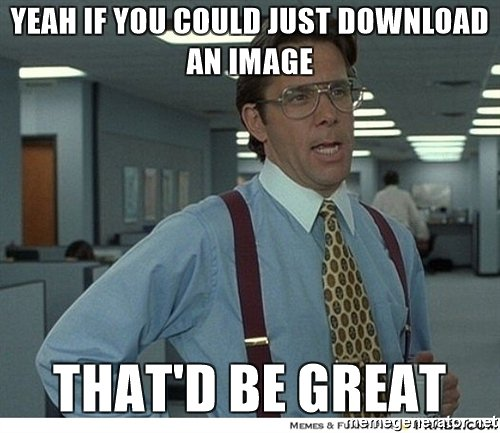

In [29]:
from IPython.display import Image
Image(filename='yeah.jpg')

## Leftover from Cary's Lecture in case the ESPN live demo goes poorly

In [30]:
from bs4 import BeautifulSoup
soup = BeautifulSoup(r.text, 'html.parser')

In [31]:
soup.find_all('a', rel=True)[:10]

[<a class='\"external' href='\"http://baconbros.com/\"' rel='\"nofollow\"' text\"="">baconbros<wbr/>.com</a>,
 <a class='\"external' href='\"https://web.archive.org/web/20090113222205/http://www.newenglandancestors.org/research/services/articles_gbr78.asp\"' rel='\"nofollow\"' text\"="">\"Ten Further Hollywood Figures (or Groups Thereof)\"</a>,
 <a class='\"external' href='\"http://www.newenglandancestors.org/research/services/articles_gbr78.asp\"' rel='\"nofollow\"' text\"="">the original</a>,
 <a class='\"external' href='\"http://www.biography.com/people/kevin-bacon-9542173\"' rel='\"nofollow\"' text\"="">\"Kevin Bacon\"</a>,
 <a class='\"external' href='\"https://www.theguardian.com/film/filmblog/2009/feb/19/best-actors-never-nominated-for-oscars\"' rel='\"nofollow\"' text\"="">\"Oscars: the best actors never to have been nominated\"</a>,
 <a class='\"external' href='\"http://www.walkoffame.com/kevin-bacon\"' rel='\"nofollow\"' text\"="">\"Hollywood Walk of Fame - Kevin Bacon\"</a>,

In [32]:
soup.select('h2.title')

[]

In [33]:
title = soup.find_all('h2', class_='title')[0]

IndexError: list index out of range

In [ ]:
good_clear_float = title.next_sibling.next_sibling

In [ ]:
urls = []
for tag in good_clear_float.find_all('a', rel=True):
    urls.append(tag.attrs['href'])

In [ ]:
urls